In [3]:
import os
import numpy as np
from matplotlib import ticker, cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.path as mpath
from copy import copy
import seaborn as sn
#from scipy import ndimage
from scipy.interpolate import griddata, NearestNDInterpolator
from numpy import uint32, uint64, float64, float32, linspace, array, logspace, sin, cos, pi, arange
from arepy.read_write import binary_read as rsnap
from arepy.visualize import data_inspection as vis
from arepy.utility import snap_utility as snut
from scipy.optimize import curve_fit
from matplotlib import gridspec
from arepy.utility import cgs_constants as cgs
from scipy.spatial import Voronoi, Delaunay, ConvexHull, voronoi_plot_2d
from matplotlib import ticker
plt.style.use('classic')

In [4]:
### constants: 
kb = 1.38e-23
kb_cgs = 1.38e-16
mH = 1.67e-24
mu = 2.8
h = 6.626e-34
h_cgs = 6.62e-27
gamma = 5./3.
pc2cm = 3.086e18
msun2g = 2e33

arepoLength = 3.0856e20
arepoMass = 1.991e33
arepoVel = 1.0e5

def rotate(x,y,theta):
  xprime = x*cos(theta) - y*sin(theta)
  yprime = x*sin(theta) + y*cos(theta)
  return xprime, yprime

arepoTime = arepoLength/arepoVel
arepoDensity = arepoMass/arepoLength/arepoLength/arepoLength
arepoEnergy= arepoMass*arepoVel*arepoVel
arepoColumnDensity = arepoMass/arepoLength/arepoLength

In [5]:
out_path = '/beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/anal/'

Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_203
Particles [ 53506435         0 117899847         0         0         0]
Masses [0.         0.         5.33459704 0.         0.         0.        ]
Gas particles 53506435
Tracer particles 117899847
Time =  [1.51518538]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
7.4003514e-38 1.529446e-15
(53506435, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/anal/rho_1kpc_203.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_204
Particles [ 53498443         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53498443
Tracer particles 117899847
Time =  [1.51554789]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type

Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_217
Particles [ 53437900         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53437900
Tracer particles 117899847
Time =  [1.52207295]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
7.020237e-38 6.757495e-16
(53437900, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/anal/rho_1kpc_217.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_218
Particles [ 53434679         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53434679
Tracer particles 117899847
Time =  [1.52261671]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:

/home/hd/hd_hd/hd_rm238/lib/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_224
Particles [ 53403629         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53403629
Tracer particles 117899847
Time =  [1.52551674]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
7.0610073e-38 5.51718e-16
(53403629, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/anal/rho_1kpc_224.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_225
Particles [ 53398187         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53398187
Tracer particles 117899847
Time =  [1.52606049]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:

Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_238
Particles [ 53413793         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53413793
Tracer particles 117899847
Time =  [1.53258556]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
7.5032666e-38 5.6762775e-16
(53413793, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/anal/rho_1kpc_238.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_239
Particles [ 53418404         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53418404
Tracer particles 117899847
Time =  [1.53312931]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID typ

Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_252
Particles [ 53378143         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53378143
Tracer particles 117899847
Time =  [1.53965438]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
1.3892644e-37 8.2164366e-16
(53378143, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/anal/rho_1kpc_252.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_253
Particles [ 53375187         0 117899847         0         0         0]
Masses [0.         0.         5.37183253 0.         0.         0.        ]
Gas particles 53375187
Tracer particles 117899847
Time =  [1.54001688]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID typ

IOError: [Errno 2] No such file or directory: '/beegfs/work/workspace/ws/hd_rm238-tracer_production-0/sim_highfreq/OUTPUT/whole_disk_258'

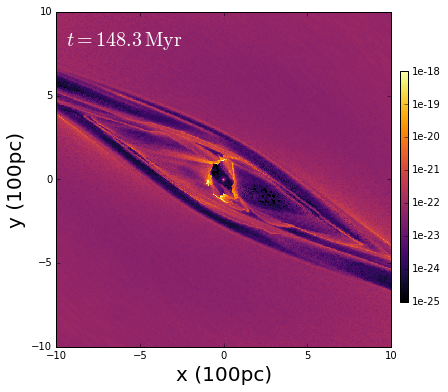

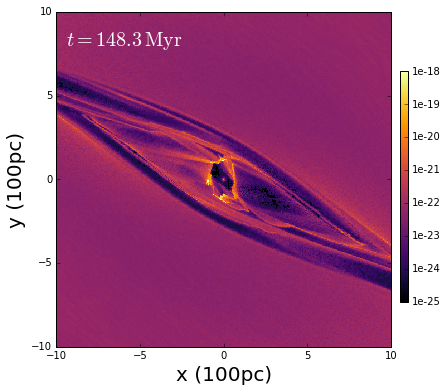

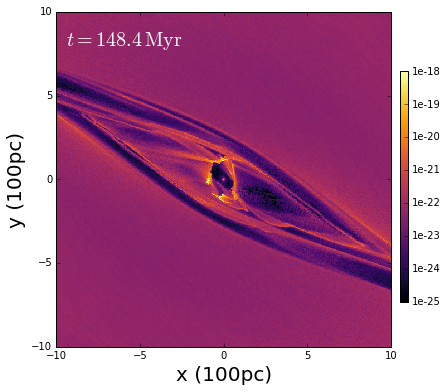

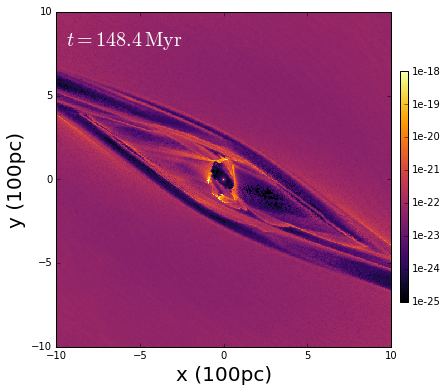

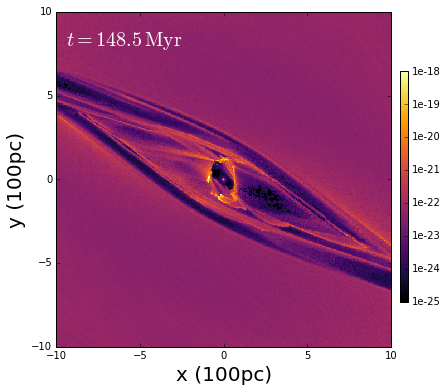

...

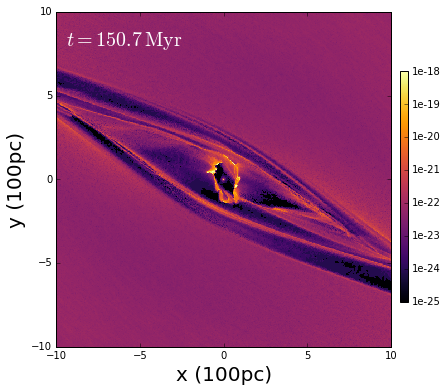

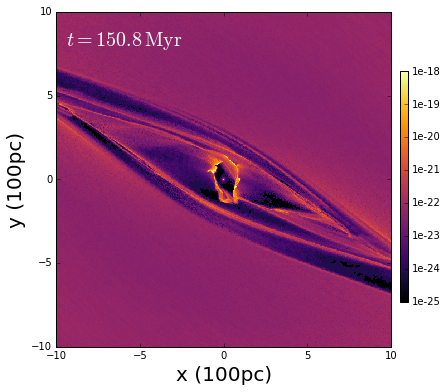

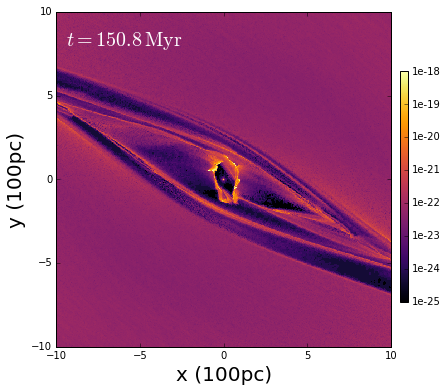

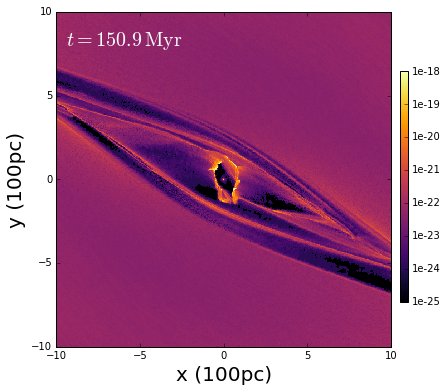

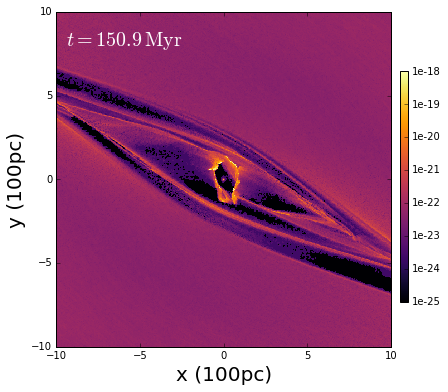

In [6]:
### Plot rho slices
plt.close()

rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=True

for isnap in arange(203,300):
  # read the data
    rsnap.io_flags['sgchem'] = True
    rsnap.io_flags['mc_tracer']=True
    data, header = rsnap.read_snapshot(out_path+'whole_disk_%03d'%isnap)
    t = header['time']
    x,y,z=data['pos'].T
    x,y,z = x-120.0, y-120.0, z-120.0
    phi = np.radians(20)
    omega=4.0
    x,y = rotate(x,y,omega*t - phi)
    rho = data['rho']*arepoDensity
    print min(rho), max(rho)
    masses = data['mass']
    vx,vy,vz = data['vel'].T
    energy_per_unit_mass = data['u_therm']
      
    points = np.vstack((x,y,z)).T
    print points.shape
    rhof = NearestNDInterpolator(points,rho)

    Nx, Ny, Nz = 601, 601, 11
    plotrange=10
    xboost = 0
    yboost = 0
    zslice=5
    xgrid, ygrid, zgrid = linspace(-plotrange,plotrange,Nx), linspace(-plotrange,plotrange,Ny), linspace(-10,10,Nz)
    #xgrid, ygrid, zgrid = linspace(-plotrange + xboost,plotrange + xboost,Nx), linspace(-plotrange + yboost,plotrange + yboost,Ny), linspace(-plotrange,plotrange,Nz)
    XGRID,YGRID,ZGRID = np.meshgrid(xgrid,ygrid,zgrid)
    RHO = rhof(XGRID,YGRID,ZGRID)
    print RHO.shape
  
    # plot
    fig, ax = plt.subplots(1,1,figsize=(6,8))
    u = 1.0
    extent = (xgrid.min()/u,xgrid.max()/u,ygrid.min()/u,ygrid.max()/u)
    levels = logspace(2,6,256)
    #norm = colors.BoundaryNorm(levels, 256)
    #dynamical_range = 8
    #levels = np.logspace(1e-34,1e-18,21)
    #norm = colors.BoundaryNorm(levels,256)
    #norm = colors.LogNorm(vmin=np.min(RHO[:,:,5]),vmax=np.max(RHO[:,:,5]))
    norm = colors.LogNorm(vmin=np.min(1e-25),vmax=np.max(1e-18))
    im = ax.imshow(RHO[:,:,zslice],origin='l',norm=norm,extent=extent,cmap='inferno',interpolation='nearest')
    #im = ax.imshow(RHO[:,:,zslice],origin='l',extent=extent,cmap='inferno',interpolation='nearest')

    ax.set_xlabel(r'x (100pc)',fontsize=20)
    ax.set_ylabel(r'y (100pc)',fontsize=20)
    ax.annotate(r'$t=%.1f\,\rm Myr$'%(t*97.856),xy=(0.03,0.9),xycoords='axes fraction',fontsize=20,color='w')
    fig.subplots_adjust(right=0.9)
    fig.subplots_adjust(wspace=0.0,hspace=0.0)
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    #cbar = fig.colorbar(im,cax=cbar_ax,ticks=np.logspace(1e-25,1e-18,21),format='%.0e')
    #plt.colorbar(im,cax=cbar_ax,ticks=logspace(-10,10,21),format='%.0e')
    cbar = plt.colorbar(im,cax=cbar_ax,ticks = [1e-25,1e-24,1e-23,1e-22,1e-21,1e-20,1e-19,1e-18],format='%.0e')
    writename = save_path+'rho_1kpc_%03d.png'%isnap
    
    print 'Writing '+writename+'...'
    fig.savefig(writename,bbox_inches='tight')
    plt.close()